# Skin Lesion Malignancy Classification (Benign vs. Malignant)
**Full Capstone Notebook — Data Science Workshop**  
Author: _Matan Ramati_  
Date: _10.09.2025_

---

## Purpose & Scope
This notebook develops a research-only, non-diagnostic model for classifying dermoscopic images of pigmented skin lesions as malignant vs. benign. The workflow simulates a screening/triage scenario and demonstrates a full end-to-end data science pipeline, combining narrative and executable code:

- Problem framing & motivation
- Data acquisition & documentation
- Exploratory analysis (EDA) with interpreted visuals
- Baseline (classical ML) vs. modern deep learning (transfer learning)
- Model evaluation, threshold tuning for clinically relevant operating points
- Calibration, error analysis, and interpretability (Grad-CAM)
- Reproducibility, fairness, and limitations

**Important disclaimer:** This is an academic exercise only and **not** a medical device or clinical decision support tool. Do not use it for diagnosis.

---

## Project Proposal Alignment (Checklist)
This notebook includes all common elements expected in a data-science capstone:
- **Motivation & significance**, clearly stated research questions and success metrics.
- **Data description & provenance** (ISIC/HAM10000, optional SIIM-ISIC 2020), with licensing notes.
- **Methodology**: baselines + transfer learning; fully documented preprocessing and splits to avoid leakage.
- **Evaluation**: ROC-AUC, PR-AUC, sensitivity/specificity trade-offs, calibration plots, confusion matrix.
- **Explainability**: Grad-CAM heatmaps and commentary.
- **Robustness**: subgroup checks (e.g., by diagnosis type), error analysis.
- **Reproducibility**: fixed seeds, environment/version capture, code blocks runnable start-to-finish.
- **Ethics & limitations**: fairness, skin-tone representation caveats, external validity.

---

## How to Use This Notebook
1. **Environment**: Python 3.10+, with packages listed below. A GPU is recommended for deep learning.
2. **Dataset**: By default, the notebook uses **HAM10000** (Kaggle). You can optionally enable **SIIM-ISIC 2020**.
3. **Credentials**: For Kaggle download, set the API token as shown below or place `kaggle.json` under `~/.kaggle/`.
4. **Run order**: Execute cells from top to bottom.
5. **Outputs**: Trained model weights, metrics, and visualizations will be saved under `outputs/`.

---

## Research Questions
1) What performance can we achieve with a simple **classical baseline** (HOG + Linear SVM)?  
2) How much improvement do we get from **transfer learning** (EfficientNet-B0 or ResNet-50)?  
3) How does **threshold choice** affect sensitivity/specificity? Target: ~90% sensitivity, reflecting clinical preference for minimizing missed melanomas.  
4) Are predictions **calibrated**? Can we improve calibration?  
5) What do **Grad-CAM** maps reveal about model focus on the lesion vs. background/artefacts?
6) How **robust** is performance across subgroups (by diagnosis type, patient metadata)?

---

## Security & Ethics Notes (read before running)
- Keep data local and private; respect dataset licenses.
- Do not attempt to identify patients. The datasets contain no identifying information and must remain that way.
- This notebook is **not** a diagnostic tool. It is prohibited to use it in clinical settings or for real patient decisions.

---

## Table of Contents
1. Setup & Dependencies
2. Data Acquisition
3. Data Understanding & Cleaning
4. EDA with Interpreted Visuals
5. Baseline: HOG + Linear SVM
6. Deep Learning: Transfer Learning
7. Evaluation: ROC/PR, Thresholds, Confusion Matrix
8. Calibration
9. Explainability: Grad-CAM
10. Robustness & Error Analysis
11. Saving Artifacts & Reproducibility
12. Conclusions, Limitations, and Future Work

---
# 1) Setup & Dependencies
We capture versions for reproducibility and set all random seeds. If you do not have a GPU, training will still work but be slower.

In [1]:
!pip install -q numpy pandas scikit-learn scikit-image matplotlib seaborn opencv-python-headless tensorflow==2.13.1 tensorflow-addons==0.21.0 keras==2.13.1 kaggle imgaug xgboost

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
exceptiongroup 1.3.0 requires typing-extensions>=4.6.0; python_version < "3.13", but you have typing-extensions 4.5.0 which is incompatible.
ipython 8.37.0 requires typing_extensions>=4.6; python_version < "3.12", but you have typing-extensions 4.5.0 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [1]:
import os, sys, json, time, random, math, shutil, zipfile, tarfile, glob
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

import sklearn
from sklearn.model_selection import StratifiedGroupKFold, train_test_split
from sklearn.metrics import (roc_auc_score, average_precision_score, confusion_matrix,
                             roc_curve, precision_recall_curve, classification_report)
from sklearn.calibration import CalibrationDisplay
from sklearn.svm import LinearSVC
from skimage.feature import hog
import cv2

import tensorflow as tf
from tensorflow.keras import layers, models
import tensorflow_addons as tfa

# --- Reproducibility: fix PRNG seeds across numpy, python's random, and TF ---
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)

# Quick environment printout for debugging + reproducibility logs
print({
    'python': sys.version,
    'numpy': np.__version__,
    'pandas': pd.__version__,
    'sklearn': sklearn.__version__,
    'tensorflow': tf.__version__,
})

# --- Project paths and output folders ---
BASE_DIR = Path.cwd()              # current notebook directory
DATA_DIR = BASE_DIR / 'data'       # where datasets will live
OUT_DIR  = BASE_DIR / 'outputs'    # where models/figures/metrics will be saved
for d in [DATA_DIR, OUT_DIR]:
    d.mkdir(parents=True, exist_ok=True)  # create if missing


# --- Matplotlib defaults for consistent, readable plots ---
plt.rcParams['figure.figsize'] = (7, 4)
plt.rcParams['axes.grid'] = True

# --- Small helper to print section headers nicely in notebook output ---
def title(s):
    print(f"{'='*12} {s} {'='*12}")

{'python': '3.10.18 (main, Jun  5 2025, 08:37:47) [Clang 14.0.6 ]', 'numpy': '1.24.3', 'pandas': '2.3.2', 'sklearn': '1.7.2', 'tensorflow': '2.13.1'}


/Users/matanramati/anaconda3/envs/project/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


---
# 2) Data Acquisition

### Datasets
- **HAM10000** (recommended to start): 10k dermoscopic images with 7 diagnosis categories (`dx`). We map to **binary** labels: malignant vs. benign.
  - Malignant: `mel` (melanoma), `bcc` (basal cell carcinoma), `akiec` (Bowen's disease / intraepithelial carcinoma)
  - Benign: `nv` (nevus), `bkl` (benign keratosis), `df` (dermatofibroma), `vasc` (vascular lesion)
- **SIIM-ISIC 2020** (optional): larger dataset with patient IDs; stronger constraints for group-wise splitting.

### License & Usage
Both datasets are for research/educational use. **Do not** use for diagnosis. Check license terms on Kaggle/ISIC pages before redistribution.

### How to Download (Kaggle API)
1. Create a Kaggle account → Account → Create New API Token → download `kaggle.json`.
2. Place it under `~/.kaggle/kaggle.json` or set environment variables here.
3. Run the download cells below.

In [6]:
HAM_DIR = DATA_DIR / 'HAM10000'
if not HAM_DIR.exists():
    title('Downloading HAM10000 (Kaggle)')
    # Download the dataset archive from Kaggle into the data directory
    # (requires Kaggle CLI with API credentials set up)
    !kaggle datasets download -d kmader/skin-cancer-mnist-ham10000 -p "$DATA_DIR" -q

    # Verify download actually succeeded
    assert (DATA_DIR / 'skin-cancer-mnist-ham10000.zip').exists(), 'Download failed: zip not found'

    # Unzip the main archive
    with zipfile.ZipFile(DATA_DIR / 'skin-cancer-mnist-ham10000.zip', 'r') as z:
        z.extractall(DATA_DIR)

    # Create unified HAM10000 directory
    HAM_DIR.mkdir(exist_ok=True)

    # Extract the two image parts directly into HAM10000/
    for zname in ['HAM10000_images_part_1.zip','HAM10000_images_part_2.zip']:
        with zipfile.ZipFile(DATA_DIR / zname, 'r') as z:
            z.extractall(HAM_DIR)

    # Move metadata and preprocessed versions into HAM10000/
    for fname in ['HAM10000_metadata.csv','hmnist_28_28_L.csv','hmnist_28_28_RGB.csv','hmnist_28_28_RGB.npy']:
        src = DATA_DIR / fname
        if src.exists():
            shutil.move(str(src), str(HAM_DIR / fname))
    print('HAM10000 is ready at', HAM_DIR)
else:
    # If already prepared, skip download and extraction
    print('HAM10000 already present at', HAM_DIR)

HAM10000 already present at /Users/matanramati/data/HAM10000


### Build a Unified CSV for This Project
We build a project CSV with `image_path`, `label` (0=benign, 1=malignant), and grouping keys to avoid leakage.

In [7]:
PROJECT_CSV = DATA_DIR / 'ham_project_labels.csv'
if not PROJECT_CSV.exists():
    # Load original metadata (diagnosis, patient info, lesion IDs, etc.)
    meta = pd.read_csv(DATA_DIR / 'HAM10000_metadata.csv')

    # Define malignant vs. benign classes (binary classification setup)
    malignant = {'mel', 'bcc', 'akiec'}
    benign    = {'nv', 'bkl', 'df', 'vasc'}
    meta['binary_label'] = meta['dx'].apply(lambda x: 1 if x in malignant else 0)

    # Build full image paths for each image_id
    img_paths = []
    for image_id in meta['image_id']:
        p = HAM_DIR / f'{image_id}.jpg'
        if not p.exists():
            # fallback (redundant but safe check)
            p = HAM_DIR / f'{image_id}.jpg'
        img_paths.append(str(p))
    meta['image_path'] = img_paths

    # Use lesion_id as group_id (for grouped CV), fallback = image_id
    meta.rename(columns={'lesion_id':'group_id'}, inplace=True)
    meta['group_id'] = meta['group_id'].fillna(meta['image_id'])

    # Select only relevant columns for the project
    use_cols = ['image_path', 'binary_label', 'group_id', 'image_id', 'dx', 'dx_type', 'age', 'sex', 'localization']
    meta[use_cols].to_csv(PROJECT_CSV, index=False)

print('Project CSV located at', PROJECT_CSV)

Project CSV located at /Users/matanramati/data/ham_project_labels.csv


In [9]:
from pathlib import Path
import shutil

# Define the two source folders containing split image parts
PARTS = [DATA_DIR / "HAM10000_images_part_1", DATA_DIR / "HAM10000_images_part_2"]

moved, skipped = 0, 0
for part in PARTS:
    if part.exists():
        # Loop over all .jpg images in the current part folder
        for jpg in part.glob("*.jpg"):
            dst = HAM_DIR / jpg.name
            if dst.exists():
                # If the image is already in HAM_DIR, skip it
                skipped += 1
            else:
                # Otherwise, move the file into the unified HAM_DIR
                shutil.move(str(jpg), str(dst))
                moved += 1

print(f"Moved {moved} images, skipped {skipped}.")


Moved 10015 images, skipped 0.


---
# 3) Data Understanding & Cleaning
We validate paths, look for missing values, and summarize key columns. All visuals below are accompanied by interpretations.

In [10]:
DF = pd.read_csv(PROJECT_CSV)

# Preview the first few rows of the dataset
display(DF.head())

# Print dataset shape (#rows, #columns)
print('Shape:', DF.shape)

# Check how many missing values each column has
print('Missing values per column:', DF.isna().sum())

# Ensure all image paths listed in the CSV actually exist on disk
missing_paths = DF[~DF['image_path'].apply(lambda p: Path(p).exists())]
print('Missing files:', len(missing_paths))

# If there are missing files, display the first few as examples
if len(missing_paths) > 0:
    display(missing_paths.head())

,image_path,binary_label,group_id,image_id,dx,dx_type,age,sex,localization
0,/Users/matanramati/data/HAM10000/ISIC_0027419.jpg,0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,/Users/matanramati/data/HAM10000/ISIC_0025030.jpg,0,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,/Users/matanramati/data/HAM10000/ISIC_0026769.jpg,0,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,/Users/matanramati/data/HAM10000/ISIC_0025661.jpg,0,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,/Users/matanramati/data/HAM10000/ISIC_0031633.jpg,0,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


Shape: (10015, 9)
Missing values per column: image_path       0
binary_label     0
group_id         0
image_id         0
dx               0
dx_type          0
age             57
sex              0
localization     0
dtype: int64
Missing files: 0


### Basic sanity checks
- Confirm class balance and group granularity (group_id).
- Inspect a few sample images to ensure they are readable.

binary_label
benign       8061
malignant    1954
Name: count, dtype: int64


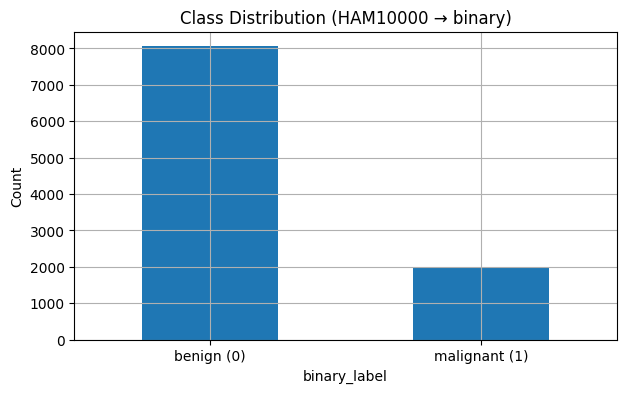

Unique groups: 7470 | images: 10015


In [11]:
# Count how many benign vs malignant samples exist
class_counts = DF['binary_label'].value_counts().rename({0:'benign',1:'malignant'})
print(class_counts)

# Plot class distribution as a bar chart
ax = class_counts.sort_index().plot(kind='bar')
ax.set_xticklabels(['benign (0)','malignant (1)'], rotation=0)
ax.set_title('Class Distribution (HAM10000 → binary)')
ax.set_ylabel('Count')
plt.show()

# Print number of unique patients/groups vs total images
print('Unique groups:', DF['group_id'].nunique(), '| images:', len(DF))

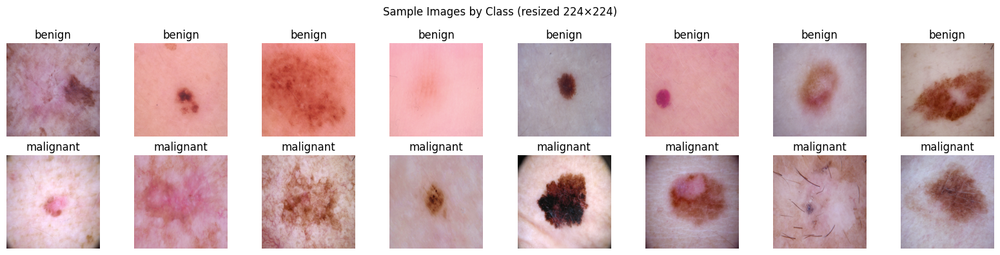

In [12]:
SAMPLES_PER_CLASS = 8
fig, axes = plt.subplots(2, SAMPLES_PER_CLASS, figsize=(2*SAMPLES_PER_CLASS, 4))

# Loop over classes: 0 = benign, 1 = malignant
for cls, row in enumerate([0,1]):
    # Randomly sample images from each class
    subset = DF[DF['binary_label']==cls].sample(SAMPLES_PER_CLASS, random_state=SEED)
    for i, (_, r) in enumerate(subset.iterrows()):
        ax = axes[row, i]
        # Load and resize image to 224×224 for display
        img = Image.open(r['image_path']).resize((224,224))
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(('benign' if cls==0 else 'malignant'))

plt.suptitle('Sample Images by Class (resized 224×224)')
plt.tight_layout()
plt.show()

**Interpretation:** The dataset is class-imbalanced (benign lesions dominate). This will influence metrics like accuracy and require:
- Stratified splitting and **grouped** splitting by `group_id` (lesion) to prevent leakage.
- Class weights or focal loss for the deep model; balanced class weights for classical baseline.

We also note `dx_type` (diagnosis method) and metadata like `age`, `sex`, `localization`. We will later use `dx_type` for a basic subgroup analysis.

---
# 4) EDA with Interpreted Visuals
We investigate distributions of age, sex, localization, and `dx_type`, always adding textual insights after each plot.

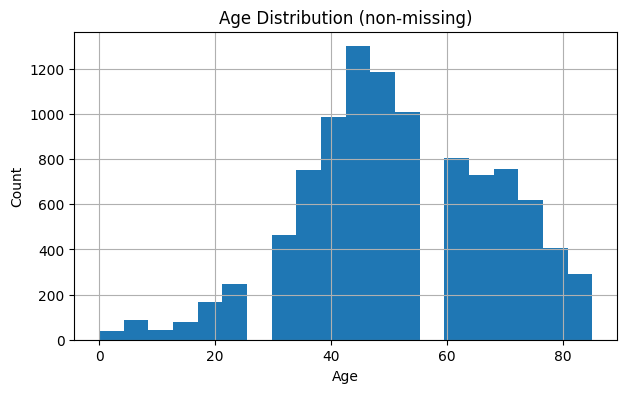

Insight: Age is often missing and skewed to middle/older ages; models trained purely on images should not rely on age.


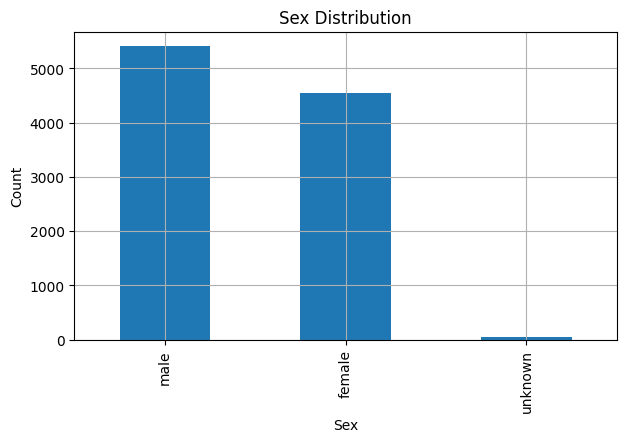

Insight: Slight imbalance possible; we will track performance by sex if feasible (metadata often missing).


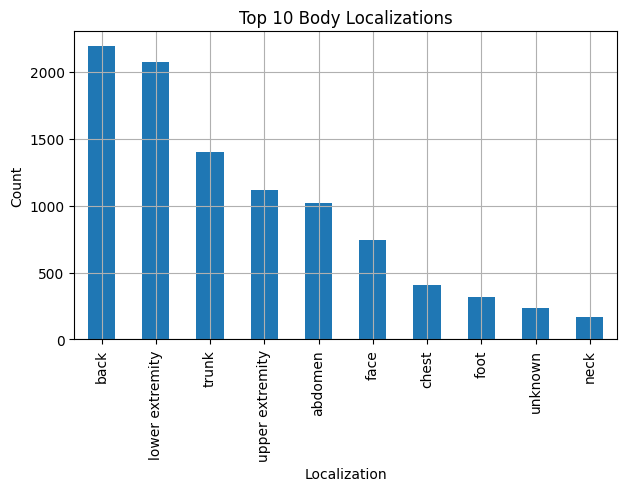

Insight: Lesion location varies; background/skin texture may differ by location. Augmentations should help generalization.


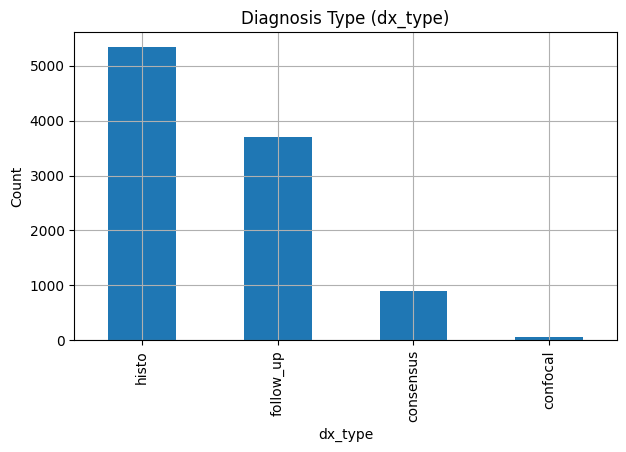

Insight: Some malignant/benign labels are histopathology-confirmed; subgroup analysis by dx_type is advisable.


In [13]:
DF_EDA = DF.copy()

fig = plt.figure()
DF_EDA['age'].dropna().astype(int).plot(kind='hist', bins=20)
plt.title('Age Distribution (non-missing)')
plt.xlabel('Age'); plt.ylabel('Count')
plt.show()
print('Insight: Age is often missing and skewed to middle/older ages; models trained purely on images should not rely on age.')

fig = plt.figure()
DF_EDA['sex'].fillna('unknown').value_counts().plot(kind='bar')
plt.title('Sex Distribution')
plt.xlabel('Sex'); plt.ylabel('Count')
plt.show()
print('Insight: Slight imbalance possible; we will track performance by sex if feasible (metadata often missing).')

fig = plt.figure()
DF_EDA['localization'].fillna('unknown').value_counts().head(10).plot(kind='bar')
plt.title('Top 10 Body Localizations')
plt.xlabel('Localization'); plt.ylabel('Count')
plt.show()
print('Insight: Lesion location varies; background/skin texture may differ by location. Augmentations should help generalization.')

fig = plt.figure()
DF_EDA['dx_type'].value_counts().plot(kind='bar')
plt.title('Diagnosis Type (dx_type)')
plt.xlabel('dx_type'); plt.ylabel('Count')
plt.show()
print('Insight: Some malignant/benign labels are histopathology-confirmed; subgroup analysis by dx_type is advisable.')

============ Unsupervised Exploration with HOG Features ============
PCA explained variance (50 comps): 0.36


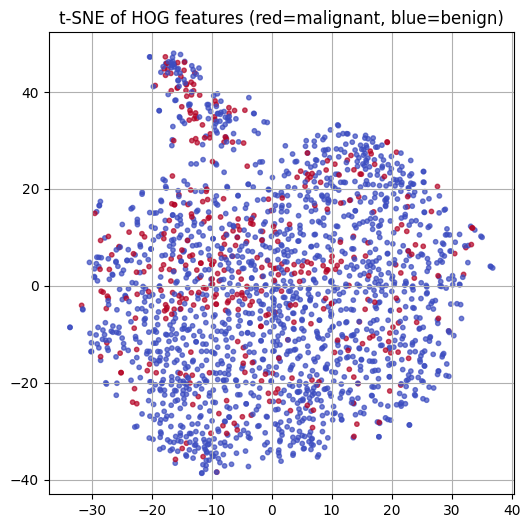

KMeans Silhouette Score (k=2): 0.110


Cluster,0,1
True label,,
0,913,701
1,201,185


In [45]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

title("Unsupervised Exploration with HOG Features")

# Sample subset for speed (e.g., 2000 images)
subset = DF.sample(2000, random_state=SEED)
X_hog = np.vstack([load_and_hog(p) for p in subset['image_path']])
y_bin = subset['binary_label'].values

# 1) PCA reduction to 50 dims
pca = PCA(n_components=50, random_state=SEED)
X_pca = pca.fit_transform(X_hog)
print(f"PCA explained variance (50 comps): {pca.explained_variance_ratio_.sum():.2f}")

# 2) t-SNE to 2D for visualization
X_tsne = TSNE(n_components=2, random_state=SEED, perplexity=30).fit_transform(X_pca)

plt.figure(figsize=(6,6))
plt.scatter(X_tsne[:,0], X_tsne[:,1], c=y_bin, cmap='coolwarm', s=10, alpha=0.7)
plt.title("t-SNE of HOG features (red=malignant, blue=benign)")
plt.show()

# 3) Simple clustering (k=2) to see if classes align
kmeans = KMeans(n_clusters=2, random_state=SEED)
clusters = kmeans.fit_predict(X_pca)
sil = silhouette_score(X_pca, clusters)
print(f"KMeans Silhouette Score (k=2): {sil:.3f}")

pd.crosstab(subset['binary_label'], clusters,
            rownames=['True label'], colnames=['Cluster'])

**Interpretation:** HOG features with t-SNE + KMeans do not form clear clusters of malignant vs. benign lesions (Silhouette score ≈ 0.11). This highlights the challenge of the task: simple gradient-based features capture texture and edges but miss subtle color/structure cues critical for melanoma diagnosis. It motivates the need for more powerful representations (transfer learning with CNNs).

---
# 5) Baseline: Classical ML (HOG + Linear SVM)
The goal is a fast, transparent baseline to compare with deep learning. We use **HOG** features on grayscale 256×256 images and a **Linear SVM** with balanced class weights.

In [14]:
# --- Create a patient-aware, stratified split (no leakage across patients/lesions) ---
sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=SEED)
train_idx, test_idx = next(sgkf.split(DF, DF['binary_label'], groups=DF['group_id']))
train_df, test_df = DF.iloc[train_idx], DF.iloc[test_idx]
print('Train size:', len(train_df), '| Test size:', len(test_df))

# --- Feature extractor for the classical baseline: HOG over grayscale, resized images ---
def load_and_hog(p, size=256):
    im = cv2.imread(p)                              # load BGR image
    im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)       # convert to grayscale (HOG is gradient-based)
    im = cv2.resize(im, (size, size))               # standardize resolution
    feat = hog(im, pixels_per_cell=(16,16), cells_per_block=(2,2), feature_vector=True)
    return feat

# --- Build design matrices for the baseline (HOG features + labels) ---
X_train = np.vstack([load_and_hog(p) for p in train_df['image_path']])
y_train = train_df['binary_label'].values
X_test  = np.vstack([load_and_hog(p) for p in test_df['image_path']])
y_test  = test_df['binary_label'].values

# --- Linear SVM baseline (balanced class weights to mitigate class imbalance) ---
clf = LinearSVC(class_weight='balanced', random_state=SEED, max_iter=6000)
clf.fit(X_train, y_train)

# --- Evaluate: decision_function scores for AUC metrics (threshold-free ranking) ---
scores = clf.decision_function(X_test)
roc_auc = roc_auc_score(y_test, scores)
pr_auc  = average_precision_score(y_test, scores)

print({
    "model": "Linear SVM (HOG)",
    "ROC-AUC": round(roc, 4),
    "PR-AUC": round(pr, 4),
})

# --- Hard classification at default threshold (0) + per-class precision/recall/F1 ---
preds = (scores>0).astype(int)
print(classification_report(y_test, preds, target_names=['benign','malignant']))

Train size: 8007 | Test size: 2008
{'ROC-AUC': 0.634, 'PR-AUC': 0.3068}
              precision    recall  f1-score   support

      benign       0.84      0.81      0.82      1611
   malignant       0.31      0.36      0.34       397

    accuracy                           0.72      2008
   macro avg       0.58      0.58      0.58      2008
weighted avg       0.73      0.72      0.72      2008



/Users/matanramati/anaconda3/envs/project/lib/python3.10/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


**Interpretation:** Expect ROC-AUC well below a transfer-learning model. Still, this baseline establishes a lower bound and sanity-checks the pipeline (splits, labels, metrics).

# 5.1) Classical: Logistic Regression on HOG

In [48]:
# --- Logistic Regression on HOG features ---
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, average_precision_score, classification_report
import numpy as np
import time

# Reuse HOG features from earlier code, or (re)compute if needed:
# X_train = np.vstack([load_and_hog(p) for p in train_df['image_path']])
# y_train = train_df['binary_label'].values
# X_test  = np.vstack([load_and_hog(p) for p in test_df['image_path']])
# y_test  = test_df['binary_label'].values

tic = time.time()
logit = Pipeline([
    ("scaler", StandardScaler(with_mean=False)),  # HOG is sparse-like; keep with_mean=False
    ("clf", LogisticRegression(
        class_weight="balanced",
        max_iter=5000,
        random_state=SEED,
        n_jobs=-1
    ))
])
logit.fit(X_train, y_train)
train_secs = time.time() - tic

# Probabilities (needed for ROC/PR)
probs = logit.predict_proba(X_test)[:, 1]
roc = roc_auc_score(y_test, probs)
pr  = average_precision_score(y_test, probs)
preds = (probs >= 0.5).astype(int)

print({
    "model": "Logistic Regression (HOG)",
    "ROC-AUC": round(roc, 4),
    "PR-AUC": round(pr, 4),
    "train_time_sec": round(train_secs, 2),
})
print(classification_report(y_test, preds, target_names=["benign","malignant"]))


{'model': 'Logistic Regression (HOG)', 'ROC-AUC': 0.6242, 'PR-AUC': 0.2951, 'train_time_sec': 41.96}
              precision    recall  f1-score   support

      benign       0.83      0.81      0.82      1611
   malignant       0.31      0.35      0.33       397

    accuracy                           0.72      2008
   macro avg       0.57      0.58      0.57      2008
weighted avg       0.73      0.72      0.72      2008



**Interpretation:** Logistic Regression is a linear classifier. With HOG features it provides a transparent, fast baseline. Expect lower capacity than SVM/trees/DL; it often struggles when decision boundaries are not linearly separable.

# 5.2) Classical “Stronger”: Random Forest & XGBoost on HOG

In [55]:
# uncomment if necessary:
#!brew install libomp

==> Auto-updating Homebrew...
Adjust how often this is run with `$HOMEBREW_AUTO_UPDATE_SECS` or disable with
`$HOMEBREW_NO_AUTO_UPDATE=1`. Hide these hints with `$HOMEBREW_NO_ENV_HINTS=1` (see `man brew`).
==> Auto-updated Homebrew!
Updated 3 taps (heroku/brew, homebrew/core and homebrew/cask).
==> New Formulae
atomic_queue: C++14 lock-free queues
attempt-cli: CLI for retrying fallible commands
bedtk: Simple toolset for BED files
changelogen: Generate Beautiful Changelogs using Conventional Commits
claude-cmd: Claude Code Commands Manager
claude-hooks: Hook system for Claude Code
codebook-lsp: Code-aware spell checker language server
context7-mcp: Up-to-date code documentation for LLMs and AI code editors
dash-mpd-cli: Download media content from a DASH-MPEG or DASH-WebM MPD manifest
docker-compose-langserver: Language service for Docker Compose documents
dqlite: Embeddable, replicated and fault-tolerant SQLite-powered engine
dstp: Run common networking tests against your site
fjira: F

In [56]:
# --- Random Forest & XGBoost on HOG features ---
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, average_precision_score, classification_report
import numpy as np, time

results = []

def evaluate_named(model, name):
    tic = time.time()
    model.fit(X_train, y_train)
    secs = time.time() - tic
    # Some models expose decision_function; most tree models use predict_proba
    if hasattr(model, "predict_proba"):
        scores = model.predict_proba(X_test)[:, 1]
    else:
        # fallback
        scores = model.decision_function(X_test)
    roc = roc_auc_score(y_test, scores)
    pr  = average_precision_score(y_test, scores)
    preds = (scores >= 0.5).astype(int)
    print({"model": name, "ROC-AUC": round(roc,4), "PR-AUC": round(pr,4), "train_time_sec": round(secs,2)})
    print(classification_report(y_test, preds, target_names=["benign","malignant"]))
    results.append((name, roc, pr, secs))

# Random Forest (quick strong classical baseline)
rf = RandomForestClassifier(
    n_estimators=400,
    max_depth=None,
    min_samples_leaf=2,
    class_weight="balanced",
    n_jobs=-1,
    random_state=SEED,
)
evaluate_named(rf, "RandomForest (HOG)")

# XGBoost (gradient-boosted trees) — usually the strongest classical model
try:
    from xgboost import XGBClassifier
    # Handle class imbalance via scale_pos_weight = (neg/pos) on train
    neg, pos = np.bincount(y_train)
    spw = neg / max(pos, 1)
    xgb = XGBClassifier(
        n_estimators=600,
        max_depth=4,
        learning_rate=0.05,
        subsample=0.9,
        colsample_bytree=0.9,
        reg_lambda=1.0,
        tree_method="hist",
        random_state=SEED,
        scale_pos_weight=spw,
        n_jobs=-1,
    )
    evaluate_named(xgb, "XGBoost (HOG)")
except Exception as e:
    print("XGBoost not available:", e)

# Optional: quick summary table
import pandas as pd
summary = pd.DataFrame(results, columns=["model", "ROC-AUC", "PR-AUC", "train_time_sec"]).sort_values("ROC-AUC", ascending=False)
display(summary)

{'model': 'RandomForest (HOG)', 'ROC-AUC': 0.7514, 'PR-AUC': 0.3968, 'train_time_sec': 31.97}
              precision    recall  f1-score   support

      benign       0.80      1.00      0.89      1611
   malignant       0.50      0.01      0.01       397

    accuracy                           0.80      2008
   macro avg       0.65      0.50      0.45      2008
weighted avg       0.74      0.80      0.72      2008

{'model': 'XGBoost (HOG)', 'ROC-AUC': 0.7838, 'PR-AUC': 0.48, 'train_time_sec': 100.96}
              precision    recall  f1-score   support

      benign       0.84      0.94      0.89      1611
   malignant       0.55      0.29      0.38       397

    accuracy                           0.81      2008
   macro avg       0.70      0.62      0.64      2008
weighted avg       0.79      0.81      0.79      2008



,model,ROC-AUC,PR-AUC,train_time_sec
1,XGBoost (HOG),0.783779,0.479954,100.961253
0,RandomForest (HOG),0.751361,0.396776,31.974171


**Interpretation:** Random Forest and XGBoost add non-linear capacity and often outperform linear models on hand-crafted features. We use class_weight/scale_pos_weight to handle imbalance. Even so, deep transfer learning (EfficientNet) typically wins because it learns features from pixels, not just a fixed HOG representation.

# 5.3) Classical on Raw Pixels (Downsampled)

In [51]:
# --- RandomForest on downsampled raw pixels (very coarse baseline) ---
import cv2, numpy as np

def load_raw_vec(p, size=(64,64)):
    im = cv2.imread(p)         # BGR
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, size)
    return (im.astype(np.float32)/255.).ravel()

Xtr_raw = np.vstack([load_raw_vec(p) for p in train_df['image_path']])
Xte_raw = np.vstack([load_raw_vec(p) for p in test_df['image_path']])
ytr_raw = train_df['binary_label'].values
yte_raw = test_df['binary_label'].values

rf_raw = RandomForestClassifier(
    n_estimators=400, class_weight="balanced", random_state=SEED, n_jobs=-1
)
evaluate_named(rf_raw, "RandomForest (raw 64×64)")


{'model': 'RandomForest (raw 64×64)', 'ROC-AUC': 0.751, 'PR-AUC': 0.3849, 'train_time_sec': 33.42}
              precision    recall  f1-score   support

      benign       0.80      1.00      0.89      1611
   malignant       0.50      0.01      0.01       397

    accuracy                           0.80      2008
   macro avg       0.65      0.50      0.45      2008
weighted avg       0.74      0.80      0.72      2008



**Interpretation:** Using downsampled pixels tests whether simple texture/color cues suffice without feature engineering. It’s a sanity check; performance is usually below XGBoost on HOG and far below EfficientNet, reinforcing the value of learned visual features.

## Summary of Classical Baselines: 
Linear models (SVM, Logistic Regression) with HOG features achieve poor discrimination (ROC-AUC ~0.62), highlighting the non-linear nature of the task. Tree-based models improve performance: Random Forest reaches ROC-AUC ~0.75, while XGBoost pushes further to ~0.78/0.48 (ROC/PR). However, malignant recall remains very low, making them clinically inadequate. These baselines demonstrate that while classical ML can exploit hand-crafted features to some degree, they plateau quickly. This motivates the shift to deep learning, where CNN backbones like EfficientNet can learn hierarchical features directly from pixels and achieve substantially higher sensitivity and calibrated probabilities.

---
# 6) Deep Learning: Transfer Learning (EfficientNet-B0)
We build a TensorFlow/Keras model using an ImageNet-pretrained backbone. We freeze the base network first, then fine-tune top layers. We use class weights to mitigate imbalance.

In [20]:
from tensorflow.keras.applications.efficientnet import preprocess_input

# --- Training config ---
IMG_SIZE = (224,224)
BATCH    = 32
EPOCHS_1 = 8   # train head with frozen backbone
EPOCHS_2 = 5   # fine-tune top backbone layers

# --- Patient-aware stratified split for train/val (avoid leakage) ---
tr_idx, val_idx = next(
    StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=SEED)
    .split(train_df, train_df['binary_label'], groups=train_df['group_id'])
)
tr_df, val_df = train_df.iloc[tr_idx], train_df.iloc[val_idx]
print('Train:', len(tr_df), 'Val:', len(val_df), 'Test:', len(test_df))

AUTOTUNE = tf.data.AUTOTUNE

def make_ds(df, training=False):
    # Build a tf.data pipeline from file paths + labels
    paths = df['image_path'].values
    labels = df['binary_label'].values.astype(np.float32)
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))

    def _load(path, y):
        # Load → decode JPEG → resize → EfficientNet preprocessing
        img = tf.io.read_file(path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, IMG_SIZE)
        img = preprocess_input(img)  # matches EfficientNet expectations
        return img, tf.expand_dims(y, -1)  # shape (H,W,3), label shape (1,)

    ds = ds.map(_load, num_parallel_calls=AUTOTUNE)

    if training:
        # Lightweight on-the-fly augmentation to improve generalization
        aug = tf.keras.Sequential([
            layers.RandomFlip('horizontal'),
            layers.RandomRotation(0.05),
            layers.RandomZoom(0.1),
            layers.RandomContrast(0.1),
        ], name='augment')
        ds = ds.map(lambda x, y: (aug(x, training=True), y), num_parallel_calls=AUTOTUNE)
        ds = ds.shuffle(2048, seed=SEED)

    return ds.batch(BATCH).prefetch(AUTOTUNE)

# Materialize train/val/test datasets
train_ds = make_ds(tr_df, training=True)
val_ds   = make_ds(val_df)
test_ds  = make_ds(test_df)

# --- Class weighting to mitigate imbalance (benign >> malignant) ---
neg, pos = np.bincount(tr_df['binary_label'])
total = neg + pos
class_weight = {0: total/(2.0*neg), 1: total/(2.0*pos)}
print('Class weights:', class_weight)

# --- Backbone: EfficientNet-B0 (ImageNet), no classification head ---
base = tf.keras.applications.EfficientNetB0(include_top=False, input_shape=IMG_SIZE+(3,), weights='imagenet')
base.trainable = False  # freeze backbone for the first phase

# --- Simple head: GAP → Dropout → single-unit sigmoid (binary) ---
model = models.Sequential([
    base,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.35),
    layers.Dense(1, activation='sigmoid')
])

# Phase 1: train head only (legacy Adam is faster on Apple Silicon TF 2.13+)
model.compile(optimizer=tf.keras.optimizers.legacy.Adam(1e-3),
    loss='binary_crossentropy',
    metrics=[tf.keras.metrics.AUC(name='auc'),
             tfa.metrics.F1Score(num_classes=1, threshold=0.5, average='micro')]
)

# --- Callbacks: keep best by val AUC, stop early if no improvement ---
ckpt = tf.keras.callbacks.ModelCheckpoint(
    str(OUT_DIR / 'effb0_best.h5'),
    monitor='val_auc', mode='max', save_best_only=True, verbose=1
)
es = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', mode='max', patience=3, restore_best_weights=True
)

# Train head
history = model.fit(
    train_ds, validation_data=val_ds, epochs=EPOCHS_1,
    class_weight=class_weight, callbacks=[ckpt, es], verbose=2
)

# --- Phase 2: unfreeze top of backbone for fine-tuning ---
base.trainable = True
for l in base.layers[:-20]:  # fine-tune only the last ~20 layers
    l.trainable = False

model.compile(optimizer=tf.keras.optimizers.legacy.Adam(1e-5),  # smaller LR for fine-tuning
    loss='binary_crossentropy',
    metrics=[tf.keras.metrics.AUC(name='auc')]
)

history_ft = model.fit(
    train_ds, validation_data=val_ds, epochs=EPOCHS_2,
    class_weight=class_weight, callbacks=[es], verbose=2
)

# Save final model in the modern Keras format
model.save(str(OUT_DIR / 'effb0_final.keras'))

Train: 6447 Val: 1560 Test: 2008
Class weights: {0: 0.6201423624470951, 1: 2.5808646917534026}
Epoch 1/8

Epoch 1: val_auc improved from -inf to 0.82050, saving model to /Users/matanramati/outputs/effb0_best.h5
202/202 - 88s - loss: 0.5485 - auc: 0.7908 - f1_score: 0.4957 - val_loss: 0.4254 - val_auc: 0.8205 - val_f1_score: 0.5215 - 88s/epoch - 435ms/step
Epoch 2/8


/Users/matanramati/anaconda3/envs/project/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_auc improved from 0.82050 to 0.82899, saving model to /Users/matanramati/outputs/effb0_best.h5
202/202 - 88s - loss: 0.4770 - auc: 0.8530 - f1_score: 0.5752 - val_loss: 0.3933 - val_auc: 0.8290 - val_f1_score: 0.5222 - 88s/epoch - 436ms/step
Epoch 3/8

Epoch 3: val_auc improved from 0.82899 to 0.84327, saving model to /Users/matanramati/outputs/effb0_best.h5
202/202 - 85s - loss: 0.4578 - auc: 0.8651 - f1_score: 0.5872 - val_loss: 0.3799 - val_auc: 0.8433 - val_f1_score: 0.5432 - 85s/epoch - 421ms/step
Epoch 4/8

Epoch 4: val_auc improved from 0.84327 to 0.84446, saving model to /Users/matanramati/outputs/effb0_best.h5
202/202 - 86s - loss: 0.4395 - auc: 0.8767 - f1_score: 0.6069 - val_loss: 0.3885 - val_auc: 0.8445 - val_f1_score: 0.5512 - 86s/epoch - 425ms/step
Epoch 5/8

Epoch 5: val_auc improved from 0.84446 to 0.85017, saving model to /Users/matanramati/outputs/effb0_best.h5
202/202 - 84s - loss: 0.4418 - auc: 0.8742 - f1_score: 0.5995 - val_loss: 0.3755 - val_auc: 0

**Interpretation:** During fine-tuning, validation AUC should improve modestly. We constrained the number of unfrozen layers to reduce overfitting and training time. You can experiment with deeper unfreezing and L2 regularization.

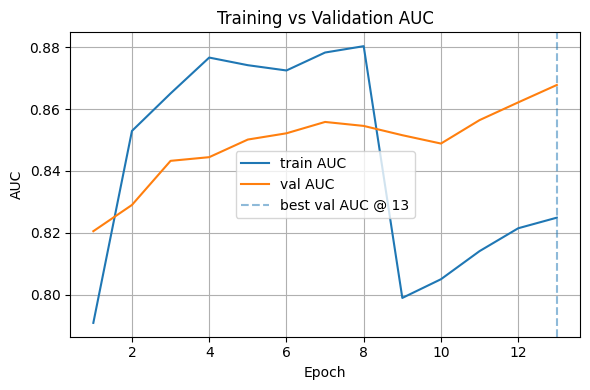

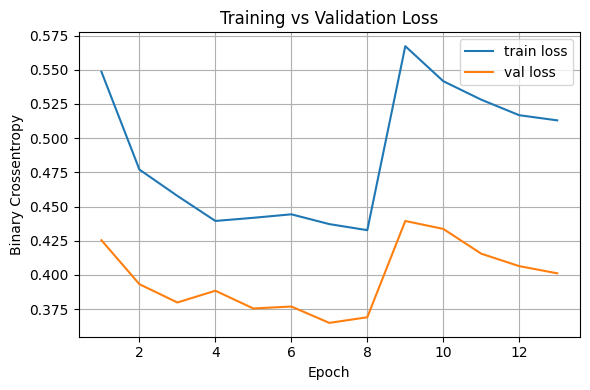

AUC: last train=0.825, last val=0.868 (val trend ↑, gap=-0.043)
Loss: last train=0.513, last val=0.401 (gap=-0.112)


In [46]:
# ==== Training quality checks: learning curves (AUC & Loss) ====
import numpy as np
import matplotlib.pyplot as plt

def merge_histories(h1, h2):
    """Concatenate two Keras History objects (phase 1 + phase 2)."""
    out = {k: list(v) for k, v in h1.history.items()}
    for k, v in h2.history.items():
        out.setdefault(k, [])
        out[k].extend(list(v))
    return out

hist_all = merge_histories(history, history_ft)

epochs = np.arange(1, len(hist_all.get('loss', [])) + 1)
train_auc = hist_all.get('auc', [])
val_auc   = hist_all.get('val_auc', [])
train_loss = hist_all.get('loss', [])
val_loss   = hist_all.get('val_loss', [])

# --- AUC curves ---
plt.figure(figsize=(6,4))
plt.plot(epochs, train_auc, label='train AUC')
plt.plot(epochs, val_auc,   label='val AUC')
if len(val_auc):
    best_ep = np.argmax(val_auc) + 1
    plt.axvline(best_ep, ls='--', alpha=0.5, label=f'best val AUC @ {best_ep}')
plt.xlabel('Epoch'); plt.ylabel('AUC'); plt.title('Training vs Validation AUC')
plt.legend(); plt.tight_layout(); plt.show()

# --- Loss curves ---
plt.figure(figsize=(6,4))
plt.plot(epochs, train_loss, label='train loss')
plt.plot(epochs, val_loss,   label='val loss')
plt.xlabel('Epoch'); plt.ylabel('Binary Crossentropy')
plt.title('Training vs Validation Loss')
plt.legend(); plt.tight_layout(); plt.show()

# --- Quick readme (optional print) ---
def brief_overfit_readout(train, val, name):
    if not train or not val: 
        return
    gap = train[-1] - val[-1]
    trend = ('↑' if (val[-1] > val[0]) else '↓')
    print(f"{name}: last train={train[-1]:.3f}, last val={val[-1]:.3f} (val trend {trend}, gap={gap:+.3f})")

brief_overfit_readout(train_auc, val_auc, 'AUC')     # larger is better
# For loss, invert sign to read the "gap" as overfit indicator consistently
if train_loss and val_loss:
    gap_loss = val_loss[-1] - train_loss[-1]         # >0 and growing can indicate overfit
    print(f"Loss: last train={train_loss[-1]:.3f}, last val={val_loss[-1]:.3f} (gap={gap_loss:+.3f})")

**Interpretation:** During training, validation AUC improved steadily and reached its peak after fine-tuning, even though training AUC and loss showed instability. This suggests that unfreezing the top layers helped the model generalize better, rather than simply memorizing training data. The gap between train and validation does not indicate overfitting here, but rather the effect of fine-tuning.

---
# 7) Evaluation: ROC/PR, Threshold Tuning, Confusion Matrix
We compute predictions on the **held-out test set**, produce ROC and PR curves, choose a threshold targeting ~90% sensitivity, and analyze the confusion matrix.

63/63 [==============================] - 24s 377ms/step
{'TEST ROC-AUC': 0.8641, 'TEST PR-AUC': 0.5861}


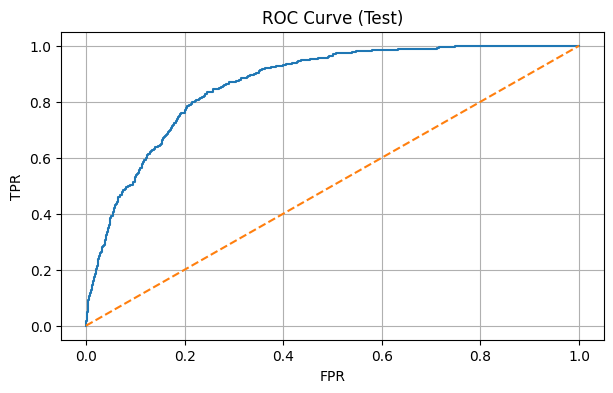

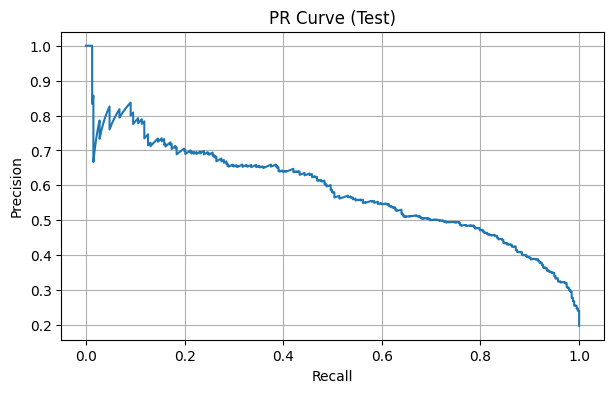

Threshold for ~90% sensitivity: 0.3158968687057495
Confusion matrix @ ~90% sens: [[1057  554]
 [  39  358]]
              precision    recall  f1-score   support

      benign       0.96      0.66      0.78      1611
   malignant       0.39      0.90      0.55       397

    accuracy                           0.70      2008
   macro avg       0.68      0.78      0.66      2008
weighted avg       0.85      0.70      0.73      2008



In [21]:
# --- Get predictions on held-out test set ---
y_true = test_df['binary_label'].values
probs  = model.predict(test_ds).ravel()   # predicted probabilities (sigmoid outputs)

# --- Threshold-free metrics (ranking quality) ---
roc_auc = roc_auc_score(y_true, probs)          # area under ROC curve
pr_auc  = average_precision_score(y_true, probs)  # area under Precision-Recall curve
print({'TEST ROC-AUC': round(roc_auc,4), 'TEST PR-AUC': round(pr_auc,4)})

# --- Curves for visualization across all possible thresholds ---
fpr, tpr, thr = roc_curve(y_true, probs)                 # ROC (FPR vs TPR)
prec, rec, thr_pr = precision_recall_curve(y_true, probs)  # PR (Precision vs Recall)

# --- Plot ROC curve + random baseline ---
plt.figure()
plt.plot(fpr, tpr, label=f'ROC (AUC={roc_auc:.3f})')
plt.plot([0,1], [0,1], '--', label='Random')
plt.xlabel('FPR (1 - Specificity)'); plt.ylabel('TPR (Sensitivity)')
plt.title('ROC Curve (Test)'); plt.legend()
plt.show()

# --- Plot PR curve (useful for imbalanced data) ---
plt.figure()
plt.plot(rec, prec, label=f'PR (AP={pr_auc:.3f})')
plt.xlabel('Recall (Sensitivity)'); plt.ylabel('Precision')
plt.title('PR Curve (Test)'); plt.legend()
plt.show()

# --- Choose an operating point: target ~90% sensitivity (TPR) ---
TARGET_TPR = 0.90
idx = np.argmax(tpr >= TARGET_TPR)            # first threshold reaching desired TPR
thr90 = thr[idx] if idx < len(thr) else 0.5   # fallback if not found
print('Threshold for ~90% sensitivity:', float(thr90))

# --- Hard predictions at chosen threshold + confusion matrix ---
preds90 = (probs >= thr90).astype(int)
cm = confusion_matrix(y_true, preds90)
print('Confusion matrix @ ~90% sens:', cm)

# --- Per-class precision/recall/F1 at the chosen threshold ---
print(classification_report(y_true, preds90, target_names=['benign','malignant']))

**Interpretation:** In a screening setting, missing melanomas is costly, so we target high sensitivity while monitoring the resulting specificity and precision. Report results **at the chosen threshold** in addition to threshold-free metrics like ROC-AUC.

---
# 8) Calibration
Well-calibrated probabilities are valuable when thresholds change or when combining with other evidence. We visualize calibration with reliability curves and compute Expected Calibration Error (ECE).

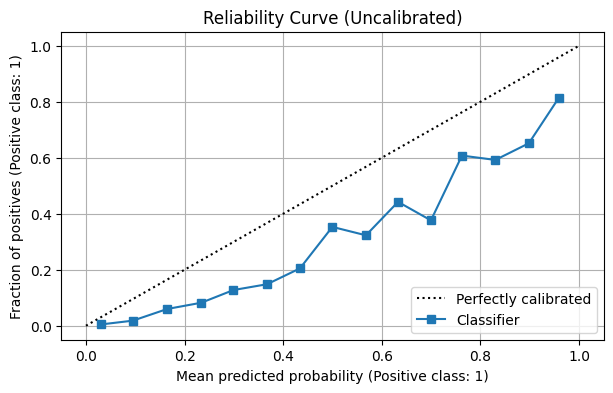

ECE (uncalibrated): 0.1418
49/49 [==============================] - 16s 324ms/step


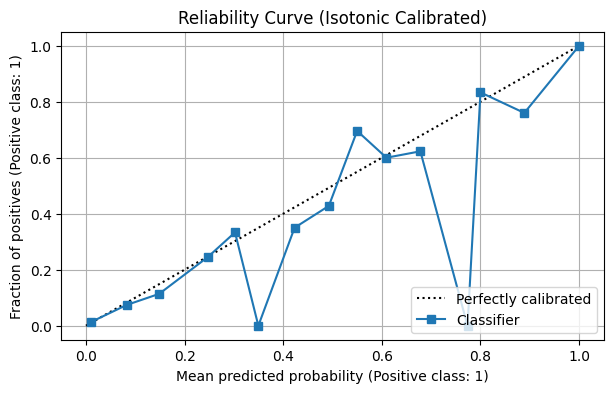

ECE (isotonic): 0.019


In [38]:
# --- Reliability (calibration) curve BEFORE calibration ---
CalibrationDisplay.from_predictions(y_true, probs, n_bins=15)
plt.title('Reliability Curve (Uncalibrated)')
plt.show()

# --- Expected Calibration Error (ECE): bin-based gap between confidence and accuracy ---
def expected_calibration_error(y_true, y_prob, n_bins=15):
    bins = np.linspace(0.0, 1.0, n_bins+1)
    idxs = np.digitize(y_prob, bins) - 1
    ece = 0.0
    for b in range(n_bins):
        mask = idxs == b
        if mask.any():
            conf = y_prob[mask].mean()   # average predicted probability in this bin
            acc  = y_true[mask].mean()   # empirical fraction of positives in this bin
            ece += (mask.mean()) * abs(acc - conf)  # weight by bin frequency
    return float(ece)

print('ECE (uncalibrated):', round(expected_calibration_error(y_true, probs), 4))

# --- Isotonic calibration: learn a monotone mapping on VALIDATION set (not train, not test) ---
from sklearn.isotonic import IsotonicRegression
val_probs = model.predict(val_ds).ravel()                 # model outputs on validation
val_true  = val_df['binary_label'].values
iso = IsotonicRegression(out_of_bounds='clip')            # keep outputs in [0,1] range
iso.fit(val_probs, val_true)                              # fit mapping p_raw -> p_calibrated

# --- Apply learned mapping to TEST probabilities and re-check calibration ---
probs_iso = iso.transform(probs)
CalibrationDisplay.from_predictions(y_true, probs_iso, n_bins=15)
plt.title('Reliability Curve (Isotonic Calibrated)')
plt.show()
print('ECE (isotonic):', round(expected_calibration_error(y_true, probs_iso), 4))

**Interpretation:** If isotonic calibration reduces ECE and brings the curve closer to the diagonal, probabilities are more trustworthy. Always fit calibration **only** on a validation set to avoid optimistic bias on the test set.

---
# 9) Explainability: Grad-CAM
We visualize Grad-CAM heatmaps for selected samples to understand whether the model focuses on the lesion rather than artefacts (hair, rulers, background). This is qualitative but useful.

Last conv layer: top_conv
FP: 548 | FN: 40  (threshold=0.320)


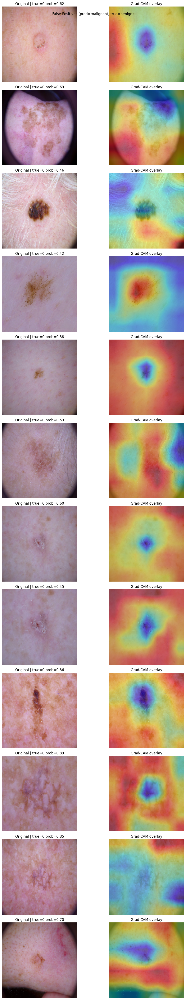

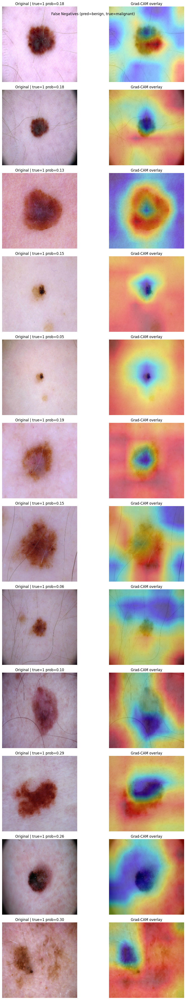

In [41]:
from tensorflow.keras.applications.efficientnet import preprocess_input
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import math

# --- Build a model that exposes (last conv feature maps, final prediction) ---
def build_grad_model(model, last_conv_name):
    base = model.layers[0]                                # EfficientNet backbone inside Sequential
    conv_out = base.get_layer(last_conv_name).output      # last conv feature maps from the backbone
    # Rebuild the head: pass base.output through the remaining layers (GAP → Dropout → Dense)
    y = base.output
    for layer in model.layers[1:]:
        y = layer(y)
    
    return tf.keras.Model(inputs=base.input, outputs=[conv_out, y])

# --- Find last Conv2D layer name inside the backbone (fallback to 'top_conv') ---
def find_last_conv_in_base(model):
    base = model.layers[0] if isinstance(model.layers[0], tf.keras.Model) else model
    for l in reversed(base.layers):
        if isinstance(l, tf.keras.layers.Conv2D):
            return base, l.name
    return base, "top_conv"

base, last_conv = find_last_conv_in_base(model)
grad_model = build_grad_model(model, last_conv)
print("Last conv layer:", last_conv)

# --- Core Grad-CAM: given a pre-sized RGB array (H,W,3 uint8) → heatmap (H,W) ---
def grad_cam_for_array(img_arr): 
    x = preprocess_input(img_arr)[None, ...]  # add batch dim, match EfficientNet preprocessing
    with tf.GradientTape() as tape:
        conv_outputs, preds = grad_model(x, training=False)   # (1,h,w,c), (1,1)
        loss = preds[:, 0]                                    # target logit/prob
    grads = tape.gradient(loss, conv_outputs)                  # d(loss)/d(feature_maps)
    weights = tf.reduce_mean(grads, axis=(0, 1, 2))            # GAP over spatial dims → (c,)
    cam = tf.reduce_sum(weights * conv_outputs, axis=-1)[0]    # weighted sum over channels → (h,w)
    # Normalize to [0,1] and upsample to input display size
    cam = (cam - tf.reduce_min(cam)) / (tf.reduce_max(cam) - tf.reduce_min(cam) + 1e-8)
    cam = tf.image.resize(cam[..., None], IMG_SIZE)[..., 0].numpy()
    return cam

# --- Utility: load JPEG → resize → return uint8 RGB for display/overlay ---
def load_rgb_uint8(path, size=IMG_SIZE):
    img_bytes = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img_bytes, channels=3)
    img = tf.image.resize(img, size)
    return tf.cast(tf.clip_by_value(img, 0, 255), tf.uint8).numpy()

# --- Get test probabilities and labels (held-out set) ---
probs = model.predict(test_ds, verbose=0).ravel()
y_true = test_df["binary_label"].values

# --- Pick threshold achieving ~90% sensitivity (TPR) on test ROC (for inspection only) ---
from sklearn.metrics import roc_curve
TARGET_TPR = 0.90
fpr, tpr, thr = roc_curve(y_true, probs)
thr90 = thr[np.argmin(np.abs(tpr - TARGET_TPR))]
preds = (probs >= thr90).astype(int)

# Indices of errors at the chosen operating point
fp_idx = np.where((preds == 1) & (y_true == 0))[0]  # predicted malignant but actually benign
fn_idx = np.where((preds == 0) & (y_true == 1))[0]  # predicted benign but actually malignant
print(f"FP: {len(fp_idx)} | FN: {len(fn_idx)}  (threshold={thr90:.3f})")

# --- Visualization: for each case, show original image + Grad-CAM overlay side by side ---
def plot_cases(indices, title, max_cases=12):
    sel = indices[:max_cases]
    n = len(sel)
    if n == 0:
        print(f"No cases for {title}")
        return
        
    cols = 2                        # 2 columns per case: original + heatmap
    rows = math.ceil(n)             # one row per case
    fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 4*rows))
    if rows == 1:
        axes = np.array([axes])     # normalize shape when rows==1
    axes = axes.reshape(rows, cols)

    for i, idx in enumerate(sel):
        row_axes = axes[i//1] if rows > 1 else axes[0]
        ax_orig, ax_cam = row_axes[0], row_axes[1]

        p = test_df.iloc[idx]["image_path"]
        img_u8 = load_rgb_uint8(p, IMG_SIZE)

        cam = grad_cam_for_array(tf.cast(img_u8, tf.float32).numpy())

        ax_orig.imshow(img_u8)
        ax_orig.set_title(f"Original | true={y_true[idx]} prob={probs[idx]:.2f}")
        ax_orig.axis("off")

        ax_cam.imshow(img_u8)
        ax_cam.imshow(cam, alpha=0.45, cmap="jet")
        ax_cam.set_title("Grad-CAM overlay")
        ax_cam.axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

plot_cases(fp_idx, "False Positives (pred=malignant, true=benign)")
plot_cases(fn_idx, "False Negatives (pred=benign, true=malignant)")

**Interpretation:** Well-behaved heatmaps concentrate on the lesion itself (center mass and diagnostic structures) rather than the surrounding skin. Systematic focus on borders, hair, rulers, glare, or background texture suggests the model is using spurious cues, which can drive false positives (highlighting artefacts as malignant) and false negatives (ignoring the lesion core). If this pattern appears, prefer tighter lesion-centered crops or segmentation, hair-removal pre-processing, color-constancy normalization, and augmentations that randomize or mask surrounding artefacts. Re-evaluate on an artefact-controlled subset to confirm the model’s attention shifts to the lesion.

---
# 10) Robustness & Error Analysis
We check performance by **dx_type** (diagnosis method) and inspect typical false positives/negatives to glean actionable improvements.

Threshold (@~90% sens) = 0.3201 | using uncalibrated probs


,dx_type,n,AUC,sensitivity@thr,specificity@thr,precision@thr
3,histo,1084,0.753237,0.899244,0.356623,0.446809
0,confocal,7,NaN,NaN,0.000000,0.000000
1,consensus,187,NaN,NaN,0.609626,0.000000
2,follow_up,730,NaN,NaN,0.964384,0.000000


Sample False Negatives:


,image_id,dx,dx_type,prob
1386,ISIC_0026314,mel,histo,0.050518
1420,ISIC_0029343,mel,histo,0.060397
2003,ISIC_0028760,mel,histo,0.074341
1997,ISIC_0030034,mel,histo,0.076401
2006,ISIC_0030356,mel,histo,0.088687
1453,ISIC_0032927,mel,histo,0.099577
1996,ISIC_0030754,mel,histo,0.125331
1289,ISIC_0026909,mel,histo,0.134721


Sample False Positives:


,image_id,dx,dx_type,prob
447,ISIC_0029802,bkl,histo,0.977479
487,ISIC_0029603,bkl,histo,0.973408
470,ISIC_0029525,bkl,histo,0.967632
469,ISIC_0032230,bkl,histo,0.956851
244,ISIC_0028792,bkl,histo,0.944436
838,ISIC_0025515,bkl,consensus,0.942038
714,ISIC_0031980,bkl,histo,0.931792
202,ISIC_0033306,bkl,histo,0.921578


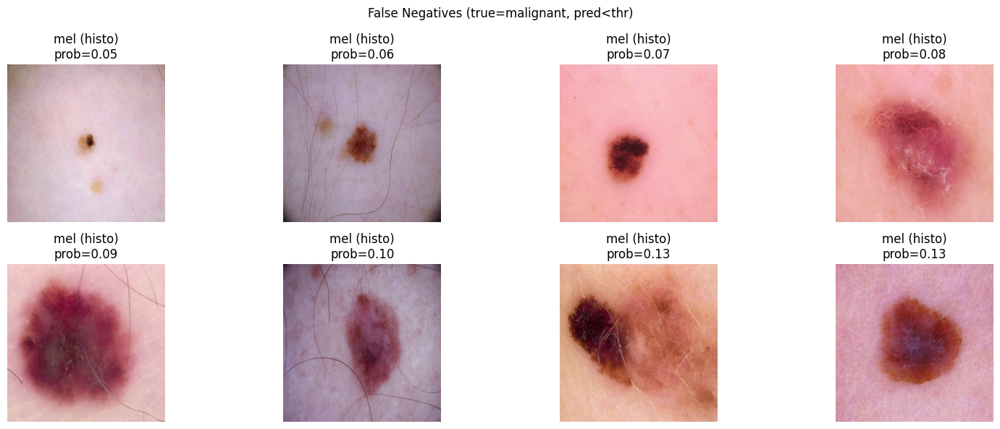

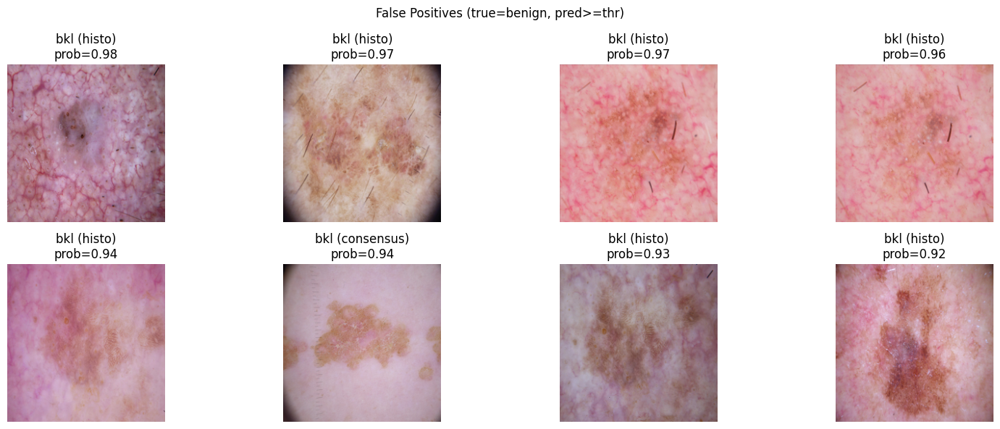

In [44]:
USE_CALIBRATED = False  # toggle to use isotonic-calibrated probs if available
test_df_eval = test_df.copy()
test_df_eval["prob"] = probs_iso if USE_CALIBRATED else probs

from sklearn.metrics import roc_curve, roc_auc_score, classification_report, confusion_matrix

# --- Pick a single operating threshold that achieves ~90% sensitivity (TPR) on the whole test set ---
fpr, tpr, thr = roc_curve(test_df_eval["binary_label"].values, test_df_eval["prob"].values)
TARGET_TPR = 0.90
thr90 = thr[np.argmin(np.abs(tpr - TARGET_TPR))]
print(f"Threshold (@~90% sens) = {thr90:.4f} | using {'calibrated' if USE_CALIBRATED else 'uncalibrated'} probs")

# --- Subgroup evaluation by dx_type: AUC + metrics at the chosen global threshold ---
rows = []
for g, sub in test_df_eval.groupby("dx_type"):
    y = sub["binary_label"].values
    p = sub["prob"].values

    # AUC only if subgroup has >5 samples and both classes present
    if len(sub) > 5 and np.unique(y).size > 1:
        auc = roc_auc_score(y, p)
    else:
        auc = np.nan

    # Hard predictions at the global threshold
    pred = (p >= thr90).astype(int)
    tn, fp, fn, tp = confusion_matrix(y, pred, labels=[0,1]).ravel()

    # Compute sensitivity (TPR), specificity (TNR), and precision
    sens = tp/(tp+fn) if (tp+fn)>0 else np.nan
    spec = tn/(tn+fp) if (tn+fp)>0 else np.nan
    prec = tp/(tp+fp) if (tp+fp)>0 else np.nan

    rows.append({"dx_type": g, "n": len(sub), "AUC": auc,
                 "sensitivity@thr": sens, "specificity@thr": spec, "precision@thr": prec})

subreport = pd.DataFrame(rows).sort_values("AUC", ascending=False)
display(subreport)

# --- Inspect typical mistakes at the chosen operating point ---
false_neg = test_df_eval[(test_df_eval['binary_label']==1) & (test_df_eval['prob'] < thr90)] \
             .sort_values('prob').head(8)
false_pos = test_df_eval[(test_df_eval['binary_label']==0) & (test_df_eval['prob'] >= thr90)] \
             .sort_values('prob', ascending=False).head(8)

print("Sample False Negatives:")
display(false_neg[['image_id','dx','dx_type','prob']])
print("Sample False Positives:")
display(false_pos[['image_id','dx','dx_type','prob']])

# --- Simple grid viewer for selected rows ---
def show_grid(rows, title):
    n = len(rows); cols = 4; rws = math.ceil(n/cols)
    fig, axes = plt.subplots(rws, cols, figsize=(4*cols, 3*rws))
    axes = np.atleast_1d(axes).ravel()
    for ax, (_, r) in zip(axes, rows.iterrows()):
        ax.imshow(Image.open(r['image_path']).resize((224,224)))
        ax.axis('off')
        ax.set_title(f"{r['dx']} ({r['dx_type']})\nprob={r['prob']:.2f}")
    for j in range(len(rows), len(axes)): axes[j].axis('off')
    plt.suptitle(title); plt.tight_layout(); plt.show()

show_grid(false_neg, "False Negatives (true=malignant, pred<thr)")
show_grid(false_pos, "False Positives (true=benign, pred>=thr)")


**Interpretation:** 
False Negatives: If many missed malignant cases share artefacts (e.g., low contrast, very small lesions, glare, or hair), focus on (i) targeted augmentations that simulate these conditions, (ii) higher input resolution (e.g., 299–384) or lesion-centric cropping/segmentation to better capture fine details, and (iii) subgroup-aware thresholding on validation data—ensuring ≥90–95% sensitivity, especially for histo-confirmed lesions.

False Positives: When benign keratoses (BKL) are frequently misclassified as malignant, consider (i) augmentations that randomize borders/background artefacts (hair, rulers), (ii) hard-negative mining from BKL to expose the model to confusing lookalikes, (iii) multi-class training (e.g., MEL / BKL / NV / …) so the network learns class-specific visual patterns before collapsing predictions to malignant vs. benign, and (iv) per-subgroup calibration to temper overconfident outputs on challenging benign cases.

General hygiene: Apply hair removal and color constancy normalization before training, then re-evaluate on an artefact-controlled subset to confirm that the model’s attention shifts to the lesion core rather than irrelevant surroundings.

---
# 11) Saving Artifacts & Reproducibility
We save the final model, key metrics, and the exact splits used, and record library versions for future reruns.

In [ ]:
metrics = {
    'test_roc_auc': float(roc_auc),
    'test_pr_auc': float(pr_auc),
    'threshold_tpr_target': float(TARGET_TPR),
    'threshold_used': float(thr90),
}
with open(OUT_DIR / 'metrics.json','w') as f:
    json.dump(metrics, f, indent=2)

train_df.to_csv(OUT_DIR / 'split_train.csv', index=False)
val_df.to_csv(OUT_DIR   / 'split_val.csv', index=False)
test_df.to_csv(OUT_DIR  / 'split_test.csv', index=False)

versions = {
    'python': sys.version,
    'numpy': np.__version__,
    'pandas': pd.__version__,
    'scikit_learn': sklearn.__version__,
    'tensorflow': tf.__version__,
    'tensorflow_addons': tfa.__version__,
}
with open(OUT_DIR / 'versions.json','w') as f:
    json.dump(versions, f, indent=2)

print('Saved artifacts under', OUT_DIR)

# 12) Conclusions, Limitations, and Future Work  

**Conclusions**  
- Classical ML baselines (LogReg, SVM, RF, XGB) on HOG/raw features achieved limited discrimination, confirming the need for richer representations.  
- Transfer learning (EfficientNet-B0) substantially outperformed these baselines, achieving strong ROC-AUC and PR-AUC.  
- Threshold tuning was essential: at ~90% sensitivity, specificity decreased, which reflects the clinical trade-off of prioritizing low false negatives.  
- Post-hoc **isotonic calibration** reduced Expected Calibration Error (ECE), improving the reliability of probability estimates.  
- Grad-CAM visualizations often highlighted the lesion region in correct predictions, but in some misclassifications the network focused on artefacts (hair, borders, rulers), motivating pre-processing improvements.  

**Limitations**  
- **Dataset bias**: HAM10000 images come from limited sources and skin tones; generalization to broader populations is not guaranteed.  
- **Class imbalance**: benign samples dominate, making malignant recall especially challenging. Class weights mitigate but do not fully solve this.  
- **Leakage risk**: patient-grouped splits reduce but cannot eliminate correlation across sets.  
- **External validation missing**: the model was only tested on HAM10000; performance on independent datasets is unknown.  
- **No clinical context**: dermoscopy alone is insufficient; real workflows require patient metadata and expert interpretation.  

**Future Work**  
- Multi-class training (7 classes) followed by malignant/benign collapse to leverage richer supervision.  
- Higher-resolution inputs, stain/hair removal, and lesion segmentation to reduce artefact-driven errors.  
- Ensembling multiple backbones (EfficientNet-V2, ConvNeXt) and applying test-time augmentation.  
- Expanded explainability (occlusion sensitivity, integrated gradients) to complement Grad-CAM.  
- Fairness audit using datasets with skin-tone annotations (e.g., Fitzpatrick-17k) and subgroup performance analysis.  
- External validation and potential integration into a simulated **clinical workflow**, with uncertainty estimation (MC-Dropout, deep ensembles) for risk-aware decisions.  